In [1]:
import pyforest

In [3]:
df = pd.read_excel('godigt_cc_data.xlsx')

df.head()

<IPython.core.display.Javascript object>

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
0,1,4384 39XX XXXX XXXX,438439,Visa,edge,2019-09-29,B,0,1,1,...,27,0,0,0,0,0,T,27729,Self Employed,290000
1,2,4377 48XX XXXX XXXX,437748,Visa,prosperity,2002-10-30,A,1,1,1,...,52,0,0,0,0,0,R,280854,0,950000
2,3,4377 48XX XXXX XXXX,437748,Visa,rewards,2013-10-05,C,0,0,0,...,23,1,0,0,0,0,R,70587,Student,210000
3,4,4258 06XX XXXX XXXX,425806,Visa,indianoil,1999-06-01,E,0,1,1,...,49,0,0,1,0,0,T,9156,Self Employed,80000
4,5,4377 48XX XXXX XXXX,437748,Visa,edge,2006-06-13,B,1,1,1,...,21,1,0,0,0,0,T,38108,Salaried,220000


In [4]:
df.shape

(8448, 28)

In [5]:
print('Number of rows in dataset is '+str(df.shape[0]))
print('Number of columns in dataset is '+str(df.shape[1]))

Number of rows in dataset is 8448
Number of columns in dataset is 28


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8448 entries, 0 to 8447
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   userid                   8448 non-null   int64         
 1   card_no                  8448 non-null   object        
 2   card_bin_no              8448 non-null   int64         
 3   Issuer                   8448 non-null   object        
 4   card_type                8448 non-null   object        
 5   card_source_date         8448 non-null   datetime64[ns]
 6   high_networth            8448 non-null   object        
 7   active_30                8448 non-null   int64         
 8   active_60                8448 non-null   int64         
 9   active_90                8448 non-null   int64         
 10  cc_active30              8448 non-null   int64         
 11  cc_active60              8448 non-null   int64         
 12  cc_active90              8448 non-

In [7]:
print('*'*50)
print('Number of rows in dataset is '+str(df.shape[0]))
print('Number of columns in dataset is '+str(df.shape[1]))
print('*'*50)
print('Number of INT64 datatype columns is '+str(len(df.select_dtypes('int64').columns)))
print('Number of FLOAT64 datatype columns is '+str(len(df.select_dtypes('float64').columns)))
print('Number of OBJECT datatype columns is '+str(len(df.select_dtypes('object').columns)))
print('Number of DATE-TIME datatype columns is '+str(len(df.select_dtypes('datetime64[ns]').columns)))

print('*'*50)

**************************************************
Number of rows in dataset is 8448
Number of columns in dataset is 28
**************************************************
Number of INT64 datatype columns is 19
Number of FLOAT64 datatype columns is 0
Number of OBJECT datatype columns is 8
Number of DATE-TIME datatype columns is 1
**************************************************


In [8]:
df.isna().sum()

userid                      0
card_no                     0
card_bin_no                 0
Issuer                      0
card_type                   0
card_source_date            0
high_networth               0
active_30                   0
active_60                   0
active_90                   0
cc_active30                 0
cc_active60                 0
cc_active90                 0
hotlist_flag                0
widget_products             0
engagement_products         0
annual_income_at_source     0
other_bank_cc_holding       0
bank_vintage                0
T+1_month_activity          0
T+2_month_activity          0
T+3_month_activity          0
T+6_month_activity          0
T+12_month_activity         0
Transactor_revolver        38
avg_spends_l3m              0
Occupation_at_source        0
cc_limit                    0
dtype: int64

In [9]:
df.isna().sum()[df.isna().sum()!=0]

Transactor_revolver    38
dtype: int64

- There are 38 null values in **Transactor_revolve** column.

In [10]:
df[df.duplicated()]

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit


- No duplicate rows in the dataset.

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
userid,8448.0,4.224500e+03,2.438872e+03,1.0,2112.75,4224.5,6336.25,8448.0
card_bin_no,8448.0,4.367470e+05,3.048975e+04,376916.0,426241.00,437551.0,438439.00,524178.0
active_30,8448.0,2.923769e-01,4.548815e-01,0.0,0.00,0.0,1.00,1.0
active_60,8448.0,4.947917e-01,5.000025e-01,0.0,0.00,0.0,1.00,1.0
active_90,8448.0,6.420455e-01,4.794271e-01,0.0,0.00,1.0,1.00,1.0
cc_active30,8448.0,2.840909e-01,4.510070e-01,0.0,0.00,0.0,1.00,1.0
cc_active60,8448.0,4.844934e-01,4.997891e-01,0.0,0.00,0.0,1.00,1.0
cc_active90,8448.0,6.323390e-01,4.821970e-01,0.0,0.00,1.0,1.00,1.0
widget_products,8448.0,3.614583e+00,2.273193e+00,0.0,2.00,4.0,6.00,7.0
engagement_products,8448.0,3.991122e+00,2.572135e+00,0.0,2.00,4.0,6.00,8.0


In [12]:
df.describe(include='object').T

,count,unique,top,freq
card_no,8448,11,4262 41XX XXXX XXXX,2084
Issuer,8448,3,Visa,7279
card_type,8448,15,rewards,1502
high_networth,8448,5,A,1740
hotlist_flag,8448,2,N,8410
other_bank_cc_holding,8448,2,Y,4728
Transactor_revolver,8410,2,T,7115
Occupation_at_source,8448,6,Salaried,3918


- Observations from Descriptive stats,
    - Annual Income at source looks like having a outliers in the data because 75% data obeys 18.8Lakhs but maximum value stays at ~50Lakhs, which can be a very expensive customer with very High salary.
    - Average spend in last 3 months also records outliers where 75% data shows spends ~66k but maximum spending value is ~2.9Lakhs.
    - Credit Card Limit has few insights as well, 
        - There are customers with NO credit card limit as well i.e. 0 cc_limit
        - Highest credit card limit issued to customer/s is 9.9Lakhs
    - Visa Card seems to be issued to lots of customers from GoDigit Bank.
    - Majority of the customers didn't hotlist their card and most of them come under **Transactor** role.

### Treat Bad Data and Null Values

In [13]:
df.isna().sum()[df.isna().sum()!=0]

Transactor_revolver    38
dtype: int64

In [16]:
len(df), (38/len(df))*100

(8448, 0.4498106060606061)

In [17]:
df[df.Transactor_revolver.isna()]

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
528,529,4258 06XX XXXX XXXX,425806,Visa,chartered,2004-10-04,A,0,0,0,...,49,0,0,0,0,0,NaN,0,Self Employed,500000
919,920,4375 51XX XXXX XXXX,437551,Visa,shoprite,2014-01-15,D,1,1,1,...,53,0,0,0,0,0,NaN,0,Salaried,150000
973,974,4386 28XX XXXX XXXX,438628,Visa,rewards,2009-08-19,E,0,1,1,...,41,0,0,0,0,0,NaN,0,Retired,90000
1173,1174,4377 48XX XXXX XXXX,437748,Visa,edge,2004-09-22,A,0,1,1,...,52,0,0,0,0,0,NaN,0,Self Employed,340000
1255,1256,4386 28XX XXXX XXXX,438628,Visa,prosperity,2014-08-31,B,0,0,0,...,30,0,0,0,0,0,NaN,0,Retired,430000
1388,1389,4262 41XX XXXX XXXX,426241,Visa,chartered,2000-08-15,A,0,0,0,...,29,0,0,0,0,0,NaN,0,Retired,380000
1444,1445,4386 28XX XXXX XXXX,438628,Visa,aura,2013-06-02,E,0,0,0,...,40,0,0,0,0,0,NaN,0,Retired,90000
1911,1912,37694 5XXXX XXXXX,376945,Amex,smartearn,2014-09-26,C,0,0,0,...,23,0,0,0,0,0,NaN,0,Retired,120000
2058,2059,5241 78XX XXXX XXXX,524178,Mastercard,smartearn,2005-08-24,E,0,1,1,...,16,0,0,0,0,0,NaN,0,Salaried,90000
2287,2288,4258 06XX XXXX XXXX,425806,Visa,prosperity,2015-01-05,A,1,1,1,...,45,0,0,0,0,0,NaN,0,0,690000


In [21]:
df.Transactor_revolver.value_counts(normalize=1)

T    0.846017
R    0.153983
Name: Transactor_revolver, dtype: float64

- From the Transactor_revolver column, it is observed that ~85% customers come under **Transactor(T)** i.e. most of the customers are willing to clear their balances in Full in every month and just ~15% come under **Revlover(R)** where customers are revolving their balances to the next months.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

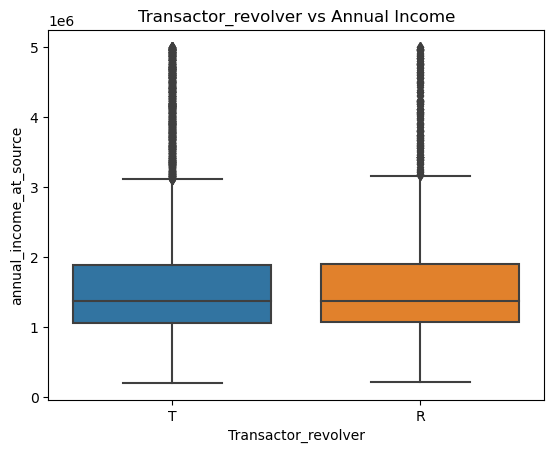

In [22]:
sns.boxplot(x=df.Transactor_revolver, y=df.annual_income_at_source)
plt.title('Transactor_revolver vs Annual Income');

- As clearing balances will depend on the **Annual Income** of the customer's as well. But from above graph, we don't find any significat difference in Annual Incomes of Customers in Transactor or Revolver categories.
- From this analysis, we can strongly impute this column with **Transactor(T)** as the majority of the customers fall under this category.

In [23]:
df.Transactor_revolver.fillna(df.Transactor_revolver.mode()[0], inplace=True)

In [24]:
df.Transactor_revolver.isna().sum()

0

In [25]:
df.Transactor_revolver.value_counts(normalize=1)

T    0.846709
R    0.153291
Name: Transactor_revolver, dtype: float64

In [26]:
df.select_dtypes(include='object').columns

Index(['card_no', 'Issuer', 'card_type', 'high_networth', 'hotlist_flag',
       'other_bank_cc_holding', 'Transactor_revolver', 'Occupation_at_source'],
      dtype='object')

In [27]:
df.card_no.value_counts(normalize=1)

4262 41XX XXXX XXXX    0.246686
4258 06XX XXXX XXXX    0.145360
4377 48XX XXXX XXXX    0.123698
4386 28XX XXXX XXXX    0.118963
4375 51XX XXXX XXXX    0.101089
5241 78XX XXXX XXXX    0.086174
4384 39XX XXXX XXXX    0.057884
4055 33XX XXXX XXXX    0.035630
37694 5XXXX XXXXX      0.033026
4477 47XX XXXX XXXX    0.032315
37691 6XXXX XXXXX      0.019176
Name: card_no, dtype: float64

In [28]:
df.Issuer.value_counts(normalize=1)

Visa          0.861624
Mastercard    0.086174
Amex          0.052202
Name: Issuer, dtype: float64

- Majority of the cards i.e. ~86% is Issued by the Visa only. Followed by Mastercard and Amex.

In [29]:
df.card_type.value_counts(normalize=1)

rewards       0.177794
prosperity    0.119200
edge          0.116004
chartered     0.109257
smartearn     0.090554
shoprite      0.081439
indianoil     0.080492
cashback      0.080019
aura          0.077178
gold          0.017164
prime         0.013258
pulse         0.011955
elite         0.011364
centurion     0.007339
platinum      0.006984
Name: card_type, dtype: float64

In [30]:
df.high_networth.value_counts(normalize=1)

A    0.205966
D    0.200758
E    0.200402
B    0.196496
C    0.196378
Name: high_networth, dtype: float64

- Very clean and equal distribution of customers in these categories.
- Letter **A** being High networth and **E** being Low networth.
- But from distribution, we can see ~20% of customers belonging to each category from all 5. 

In [31]:
df.hotlist_flag.value_counts(normalize=1)

N    0.995502
Y    0.004498
Name: hotlist_flag, dtype: float64

- Very baised data/column because ~99.96% customers don't run into blocking or hotlisting the card under any circuminstances. 

In [35]:
df.other_bank_cc_holding.value_counts(normalize=1)

Y    0.559659
N    0.440341
Name: other_bank_cc_holding, dtype: float64

- Almost stable data states, ~56% customers opt for other banks credit cards as well. Whereas, just ~44% customers don't.

In [36]:
df.Transactor_revolver.value_counts(normalize=1)

T    0.846709
R    0.153291
Name: Transactor_revolver, dtype: float64

- We have already seen that there are more customers following **Transactor** approach rather than **Revolver** approach which is a good behaviour.

In [37]:
df.Occupation_at_source.value_counts(normalize=1)

Salaried         0.463778
Self Employed    0.257457
Retired          0.128906
Student          0.073509
Housewife        0.045455
0                0.030895
Name: Occupation_at_source, dtype: float64

In [38]:
df.Occupation_at_source.value_counts()

Salaried         3918
Self Employed    2175
Retired          1089
Student           621
Housewife         384
0                 261
Name: Occupation_at_source, dtype: int64

- There are 261 bad values (0 value) in Occupation column. We need to treat it before doing any analysis.
- A good indication that almost half of the data i.e. ~46% Customers are Salaried. 
- It can be a good predictor for improving bank profits by targetting right set of customers.

In [39]:
df.groupby('Occupation_at_source').mean()['cc_limit']

Occupation_at_source
0                750881.226054
Housewife         95104.166667
Retired           95959.595960
Salaried         236510.974987
Self Employed    321816.091954
Student          262190.016103
Name: cc_limit, dtype: float64

In [40]:
df[df.Occupation_at_source==0]['cc_limit']

1       950000
52      760000
83      720000
89      750000
136     950000
         ...  
8287    820000
8345    600000
8347    600000
8421    710000
8443    970000
Name: cc_limit, Length: 261, dtype: int64

In [41]:
df[df.cc_limit>500000]#.iloc[:50,[16,-2]]

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
1,2,4377 48XX XXXX XXXX,437748,Visa,prosperity,2002-10-30,A,1,1,1,...,52,0,0,0,0,0,R,280854,0,950000
13,14,4375 51XX XXXX XXXX,437551,Visa,prosperity,2017-10-17,A,1,1,1,...,7,0,0,0,0,0,T,17309,Salaried,690000
40,41,4384 39XX XXXX XXXX,438439,Visa,prosperity,2008-10-13,A,0,0,1,...,45,0,0,0,0,0,T,99860,Salaried,580000
42,43,4262 41XX XXXX XXXX,426241,Visa,prosperity,1999-11-02,A,0,1,1,...,25,0,0,1,0,0,T,145904,Self Employed,550000
46,47,5241 78XX XXXX XXXX,524178,Mastercard,prime,2015-03-05,A,0,0,1,...,55,0,0,0,0,0,T,225358,Salaried,740000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8432,8433,4386 28XX XXXX XXXX,438628,Visa,prosperity,2008-06-23,A,1,1,1,...,26,1,0,0,0,0,T,34331,Salaried,970000
8434,8435,4384 39XX XXXX XXXX,438439,Visa,prosperity,2014-10-15,A,1,1,1,...,58,1,0,0,0,0,T,70406,Self Employed,520000
8435,8436,4262 41XX XXXX XXXX,426241,Visa,edge,2001-10-05,A,1,1,1,...,32,0,0,1,0,0,T,129679,Self Employed,540000
8438,8439,5241 78XX XXXX XXXX,524178,Mastercard,prime,2007-04-13,A,0,0,1,...,35,0,0,0,0,0,T,34563,Salaried,530000


In [42]:
df.Occupation_at_source.replace({0:'Salaried'}, inplace=True)

df.Occupation_at_source.value_counts(normalize=True)

Salaried         0.494673
Self Employed    0.257457
Retired          0.128906
Student          0.073509
Housewife        0.045455
Name: Occupation_at_source, dtype: float64

<IPython.core.display.Javascript object>

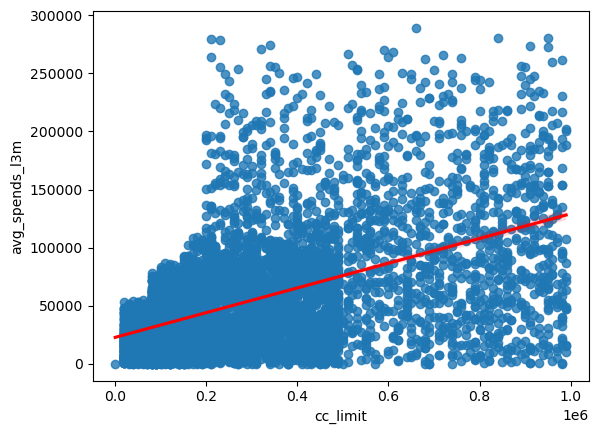

In [80]:
sns.regplot(x='cc_limit',y='avg_spends_l3m',data=df, line_kws={"color": "red"});

In [75]:
df.annual_income_at_source.head()

0    1552111
1    4833871
2    1345429
3     880560
4    1808582
Name: annual_income_at_source, dtype: int64

In [82]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit'],
      dtype='object')

### Feature Engineering
- Aggregate particular columns,
    - Total Transactions Activity (T+1, T+2, T+3, T+6, T+12) 
    - Account activity (active_30, active_60, active_90)
    - Credit Card activity (cc_active30, cc_active60, cc_active90)
- Credit card utilization ratio - average spends over last 3 months by credit card limit will give us the ratio about utilization of the credit card. (High ratio is best)
- Risk values based on Occupation - (Below risk scores are assigned as per General research from Banking history data, these values might vary in different situations or aspects. But for Generalisation, these are credit risk scores.
    - Salaried: 5 (Meduim risk)
    - Self Employed: 7 (High risk)
    - Retired: 3 (Low risk)
    - Student: 8 (High risk)
    - Housewife: 2 (Low risk)
- Total Risk score = (Occupation risk value) + (Annual income/credit card limit) + (average spends/credit card limit)

In [83]:
df['Total_Transactions_Activity'] = df['T+1_month_activity'] + df['T+2_month_activity'] + df['T+3_month_activity'] + df['T+6_month_activity'] + df['T+12_month_activity']

df['Account_Activity'] = df.active_30 + df.active_60 + df.active_90

df['Credit_Card_Activity'] = df.cc_active30 + df.cc_active60 + df.cc_active90

df['Credit_Card_Utilization_Ratio'] = np.round(df.avg_spends_l3m / df.cc_limit, 2)

In [111]:
occ_val_counts = df.Occupation_at_source.value_counts(normalize=1).to_dict()
occ_val_counts

{'Salaried': 0.49467329545454547,
 'Self Employed': 0.25745738636363635,
 'Retired': 0.12890625,
 'Student': 0.07350852272727272,
 'Housewife': 0.045454545454545456}

In [112]:
occ_risk_val = {'Salaried':0.5,'Self Employed':0.7,'Retired':0.3,'Student':0.8,'Housewife':0.2}
for val in occ_val_counts.keys():
    occ_val_counts[val] = occ_val_counts[val]*occ_risk_val[val]

occ_val_counts

{'Salaried': 0.24733664772727273,
 'Self Employed': 0.18022017045454544,
 'Retired': 0.038671875,
 'Student': 0.05880681818181818,
 'Housewife': 0.009090909090909092}

In [113]:
df['occ_risk_score'] = df.Occupation_at_source.map(occ_val_counts)

In [127]:
df['Total_risk_score'] = (df.occ_risk_score + (df.annual_income_at_source/df.cc_limit) + (df.avg_spends_l3m/df.cc_limit))

In [128]:
df[['Total_Transactions_Activity','Account_Activity','Credit_Card_Activity', 'Credit_Card_Utilization_Ratio','occ_risk_score', 'Total_risk_score']].head(10)

,Total_Transactions_Activity,Account_Activity,Credit_Card_Activity,Credit_Card_Utilization_Ratio,occ_risk_score,Total_risk_score
0,0,2,0,0.10,0.180220,5.627944
1,0,3,0,0.30,0.247337,5.631258
2,1,0,0,0.34,0.058807,6.801740
3,1,2,3,0.11,0.180220,11.301670
4,1,3,2,0.17,0.247337,8.641382
5,0,1,2,0.89,0.038672,17.879072
6,0,3,0,0.79,0.038672,20.353022
7,0,2,3,0.15,0.247337,8.042933
8,0,1,0,0.47,0.009091,10.646524
9,0,0,3,0.12,0.247337,15.739849


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

C:\Users\pranai\AppData\Local\Temp\ipykernel_20316\568774240.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  sns.pairplot(df.drop(['userid','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1));


<Figure size 1200x1200 with 0 Axes>

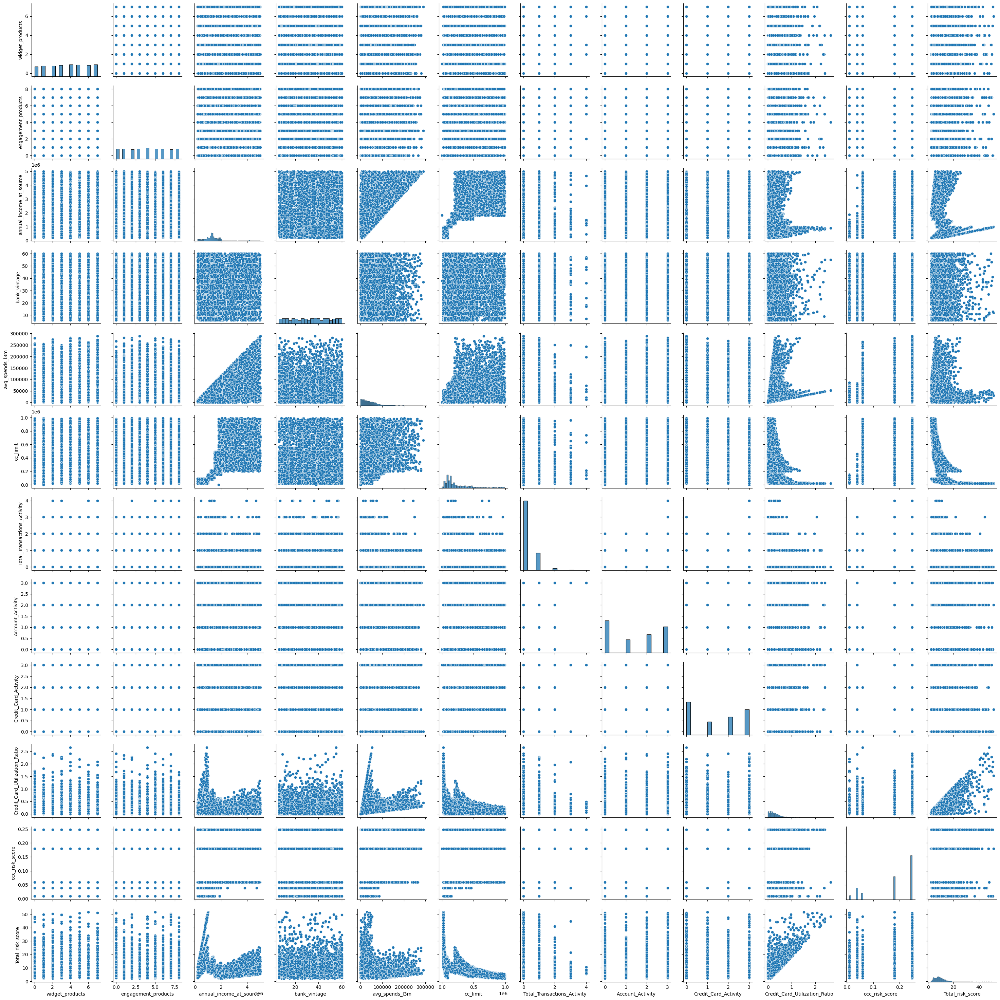

In [135]:
plt.figure(figsize=(12,12))
sns.pairplot(df.drop(['userid','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1));

In [131]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit',
       'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

C:\Users\pranai\AppData\Local\Temp\ipykernel_20316\442378732.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  sns.clustermap(df.drop(['userid','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1).corr(), annot=True, fmt='.2f');


<Figure size 1500x1500 with 0 Axes>

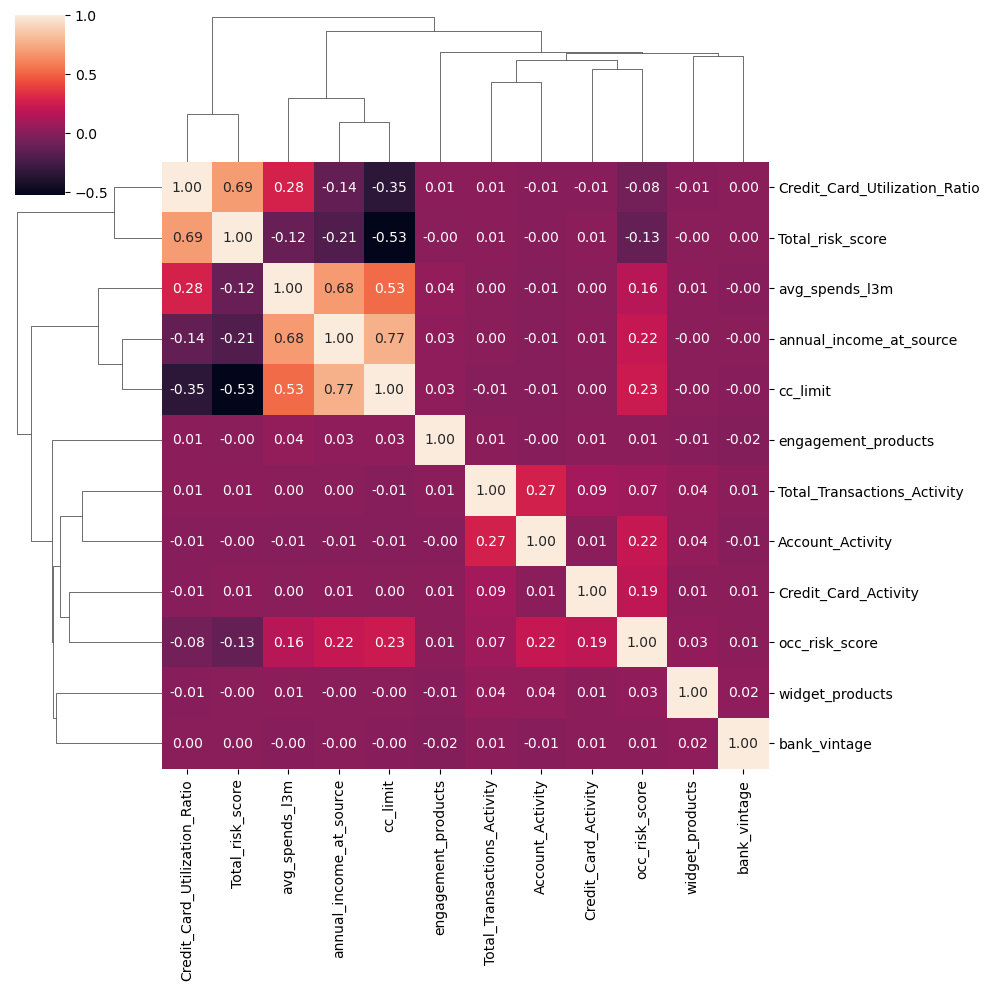

In [134]:
plt.figure(figsize=(15,15))
sns.clustermap(df.drop(['userid','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1).corr(), annot=True, fmt='.2f');

In [98]:
df[['Total_Transactions_Activity','Account_Activity','Credit_Card_Activity', 'Credit_Card_Utilization_Ratio', 'CC_risk_score']].corr()

,Total_Transactions_Activity,Account_Activity,Credit_Card_Activity,Credit_Card_Utilization_Ratio,CC_risk_score
Total_Transactions_Activity,1.000000,0.268204,0.090086,0.005778,0.072177
Account_Activity,0.268204,1.000000,0.008602,-0.007386,0.215450
Credit_Card_Activity,0.090086,0.008602,1.000000,-0.005646,0.193741
Credit_Card_Utilization_Ratio,0.005778,-0.007386,-0.005646,1.000000,-0.077448
CC_risk_score,0.072177,0.215450,0.193741,-0.077448,1.000000


In [38]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit'],
      dtype='object')

## Assumptions on the Dataset
- **Objective** - To increase profits for GoDigit Bank but decrease attrition rate on Credit Cards.
    - Customer needs to spend more via Credit Card,
        - It can only happen when Annual Income of Customer is bearable or decent in market.
        - Customers occupation decides the ability of them to the purchasing capacity of the credit card.
        - On contrast, Customers not using credit card since last 60 or 90 days, will have to decrease credit limit as well as update policies. Similarly, Customers who are using card regularly needs to taken care and provide special benefits such as cash backs, offers, coupons, etc.
        - Average spending on last 3 months decides the purchasing history of the customers.
        - Credit limit will enforce customers to spend till the limit provided but not over exceeding. So this will be a crucial parameter to estimate.
        - If Customers already having other banks credit card then it influeneces customers to utilize GoDigit Credit cards, Hence Bank should come up with an idea like waiving off charges on minimum amount spent or other offers to attract customers.
        - If credit card hotlisted for some reason then it hinders user's usage on the card, which is a bad impact.
        - Average spends over last 3 months in relation with,
            - Annual Income of the customer
            - Credit card limit

## Data Visualization

### Univariate Analysis

<IPython.core.display.Javascript object>

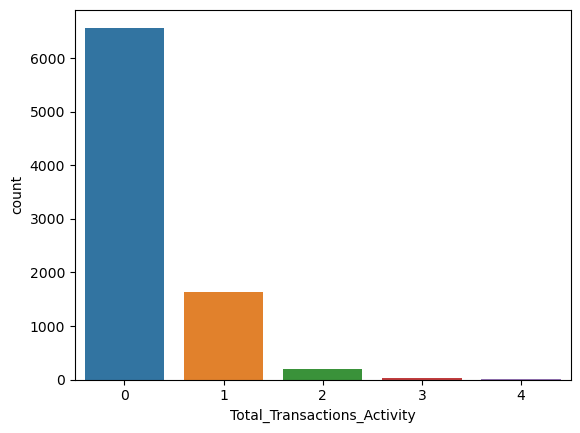

In [136]:
sns.countplot(x=df.Total_Transactions_Activity);

<IPython.core.display.Javascript object>

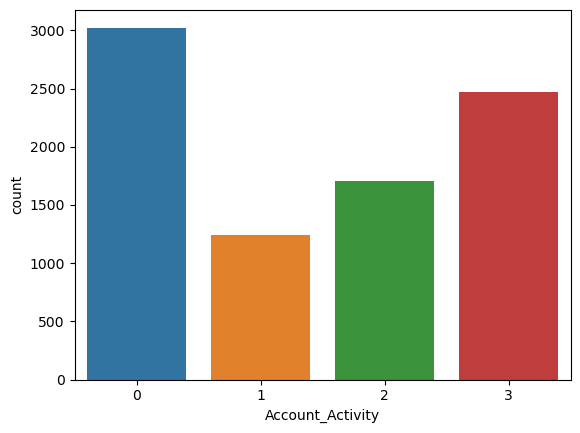

In [137]:
sns.countplot(x=df.Account_Activity);

<IPython.core.display.Javascript object>

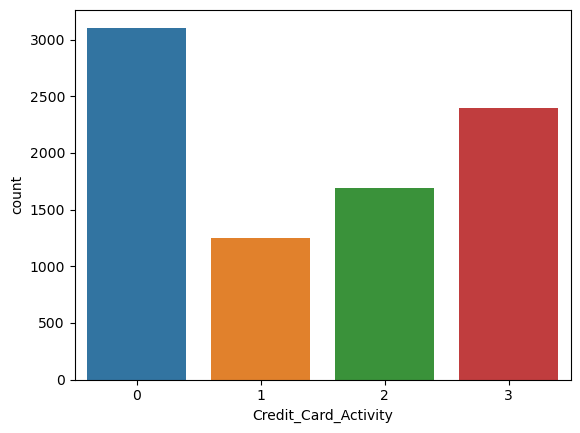

In [138]:
sns.countplot(x=df.Credit_Card_Activity);

<IPython.core.display.Javascript object>

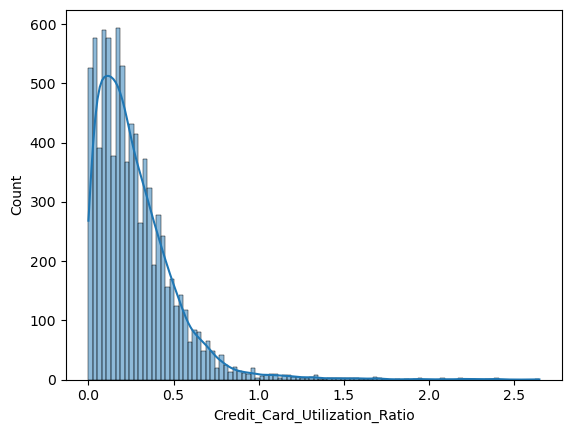

In [139]:
sns.histplot(df.Credit_Card_Utilization_Ratio, kde=1);

<IPython.core.display.Javascript object>

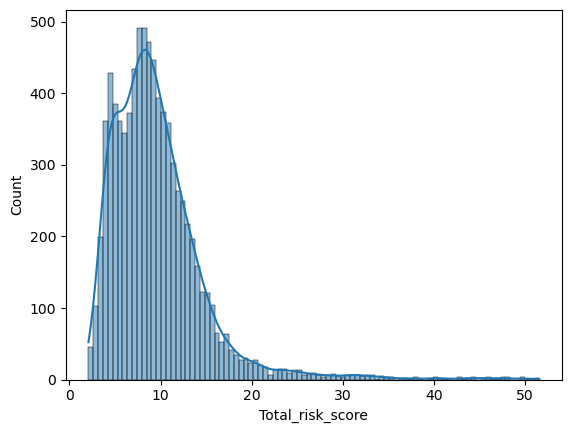

In [140]:
sns.histplot(df.Total_risk_score, kde=1);

<IPython.core.display.Javascript object>

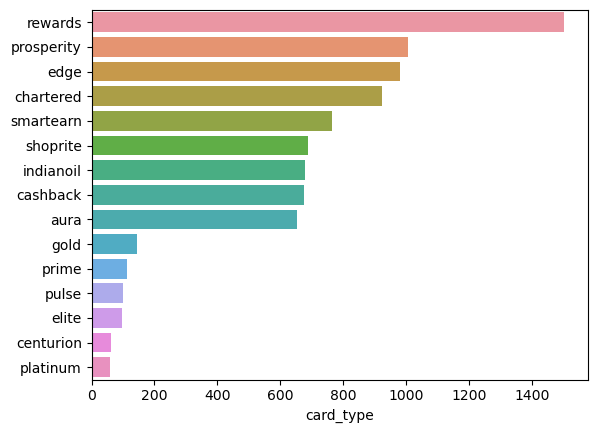

In [161]:
sns.barplot(y=df.card_type.value_counts().index, x=df.card_type.value_counts());

<IPython.core.display.Javascript object>

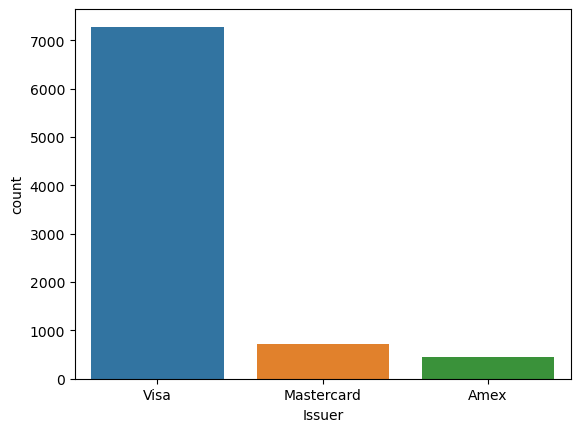

In [162]:
sns.countplot(x=df.Issuer);

### Bi-Variate Analysis
   - Some potential variables for bivariate analysis could be:
       - Annual Income vs. Credit Card Spending
       - Occupation vs. Credit Card Spending
       - Bank Vintage vs. Credit Card Spending
       - Other Bank Credit Card Holdings vs. Credit Card Spending
       - Engagement Products vs. Credit Card Spending
       - T+1/T+2/T+3/T+6/T+12 month activity vs. Credit Card Spending
       - Transactor_revolver vs. Credit Card Spending
       - Active_30/Active_60/Active_90 vs. Credit Card Spending
       - High Net Worth vs. Credit Card Spending
       - Average spends_l3m vs. Credit Card Spending
       - Credit Card Type vs. Credit Card Spending
       - Card Source Date vs. Credit Card Spending
       - CC Limit vs. Credit Card Spending

In [141]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit',
       'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

<IPython.core.display.Javascript object>

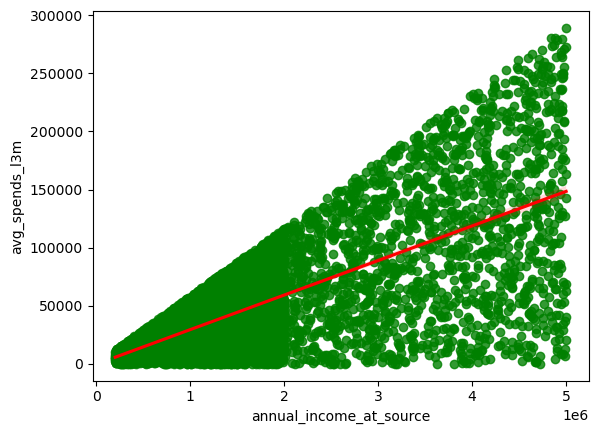

In [143]:
sns.regplot(x='annual_income_at_source',y='avg_spends_l3m', data=df, line_kws={"color": "red"}, color='green');

<IPython.core.display.Javascript object>

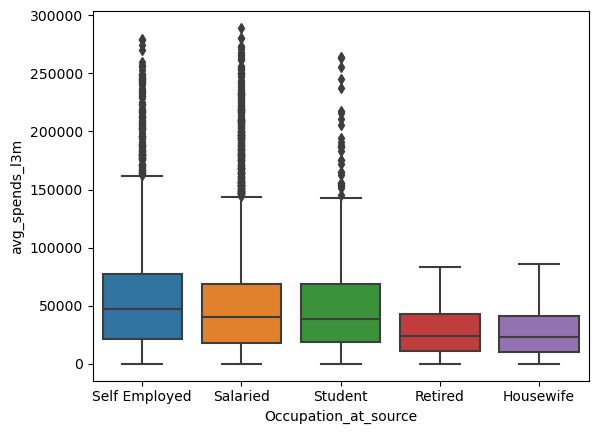

In [144]:
sns.boxplot(x=df.Occupation_at_source, y=df.avg_spends_l3m);

<IPython.core.display.Javascript object>

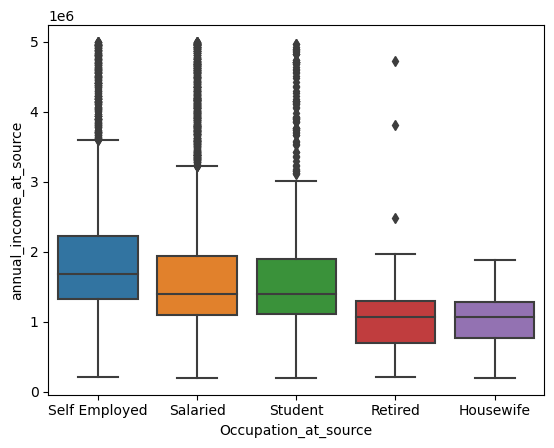

In [147]:
sns.boxplot(x=df.Occupation_at_source, y=df.annual_income_at_source);

<IPython.core.display.Javascript object>

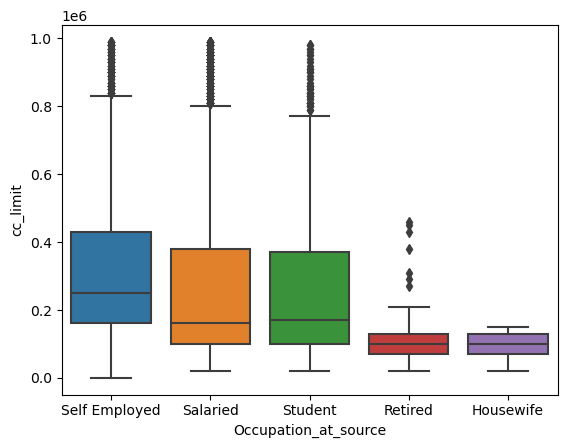

In [145]:
sns.boxplot(x=df.Occupation_at_source, y=df.cc_limit);

<IPython.core.display.Javascript object>

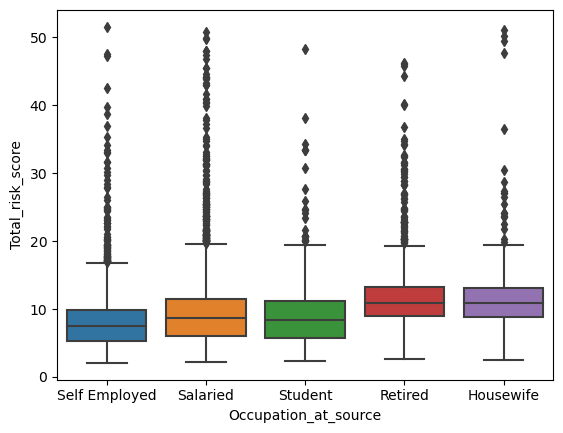

In [146]:
sns.boxplot(x=df.Occupation_at_source, y=df.Total_risk_score);

<IPython.core.display.Javascript object>

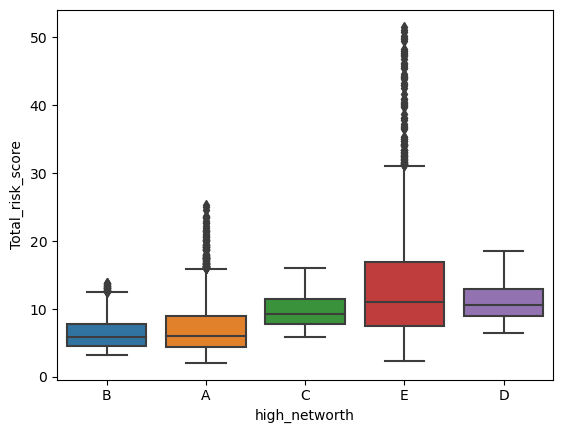

In [148]:
sns.boxplot(x=df.high_networth, y=df.Total_risk_score);

<IPython.core.display.Javascript object>

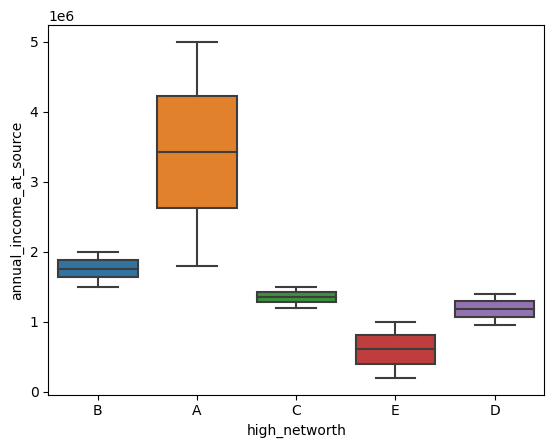

In [149]:
sns.boxplot(x=df.high_networth, y=df.annual_income_at_source);

<IPython.core.display.Javascript object>

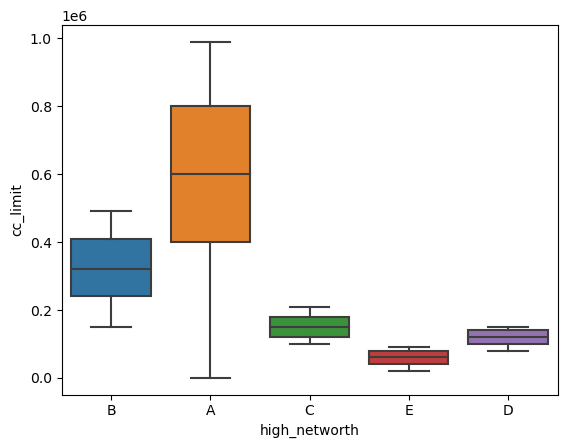

In [150]:
sns.boxplot(x=df.high_networth, y=df.cc_limit);

<IPython.core.display.Javascript object>

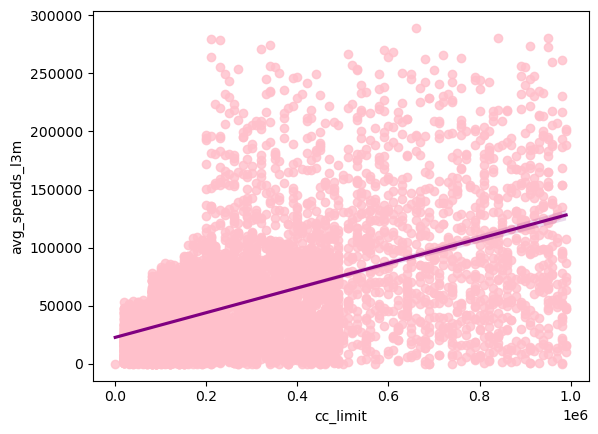

In [153]:
sns.regplot(x='cc_limit',y='avg_spends_l3m', data=df, line_kws={"color": "Purple"}, color='pink');

<IPython.core.display.Javascript object>

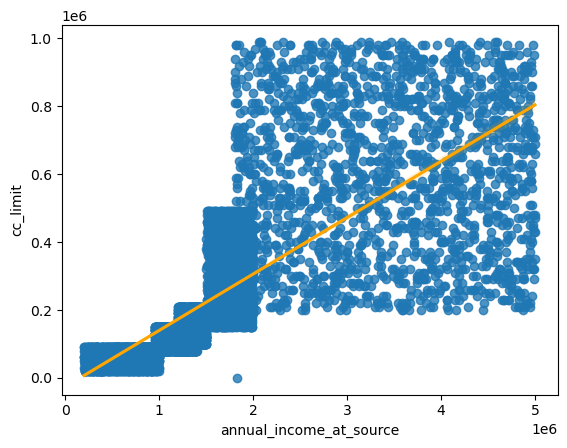

In [156]:
sns.regplot(x='annual_income_at_source',y='cc_limit', data=df, line_kws={"color": "orange"});

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

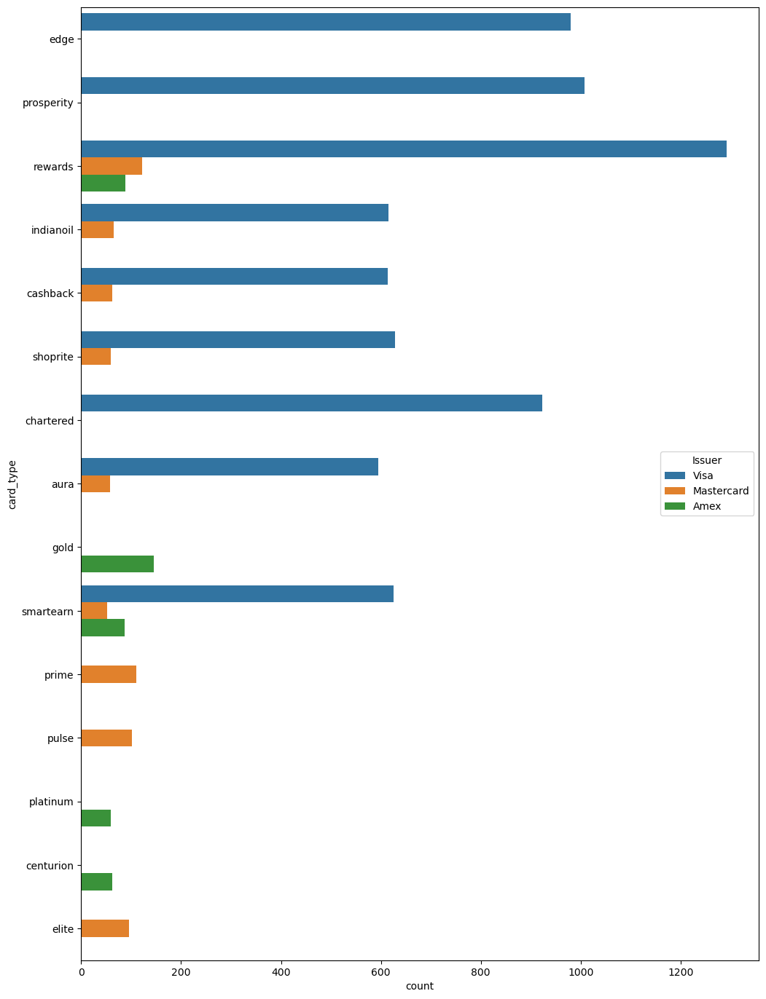

In [166]:
plt.figure(figsize=(12,17))
sns.countplot(y=df.card_type, hue=df.Issuer);

<IPython.core.display.Javascript object>

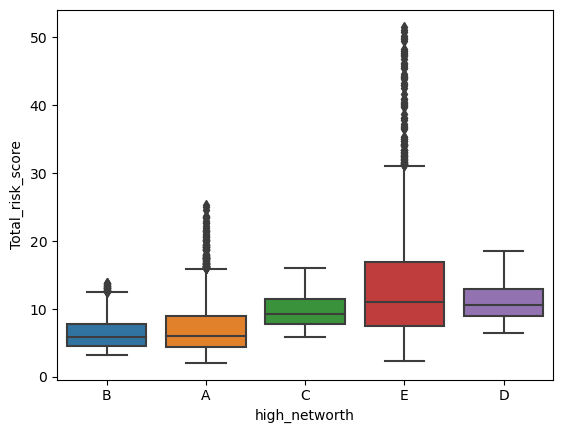

In [212]:
sns.boxplot(x=df.high_networth, y=df.Total_risk_score);

<IPython.core.display.Javascript object>

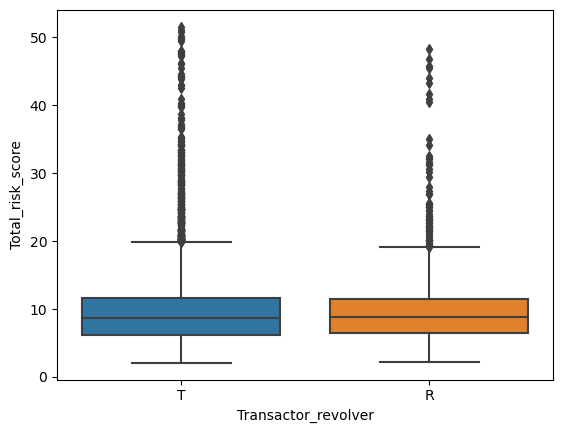

In [214]:
sns.boxplot(x=df.Transactor_revolver, y=df.Total_risk_score);

<IPython.core.display.Javascript object>

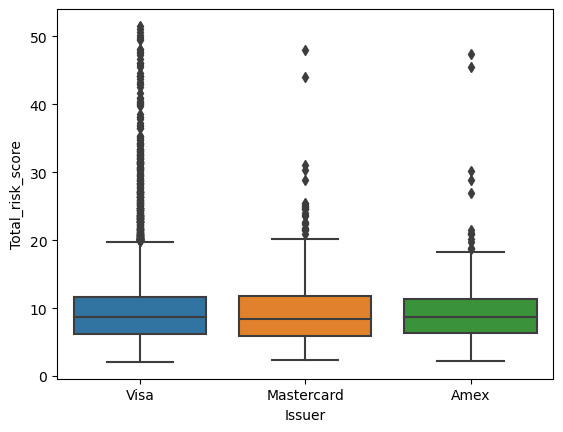

In [215]:
sns.boxplot(x=df.Issuer, y=df.Total_risk_score);

<IPython.core.display.Javascript object>

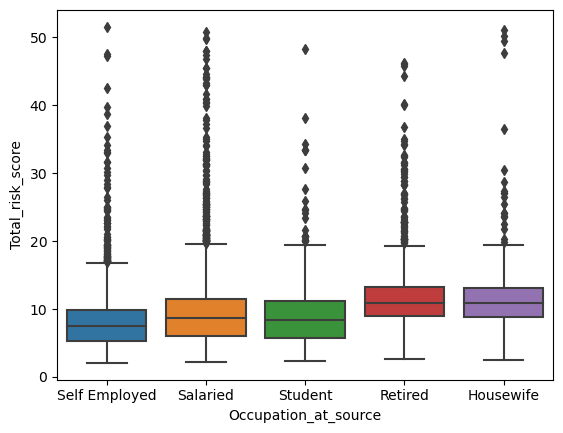

In [216]:
sns.boxplot(x=df.Occupation_at_source, y=df.Total_risk_score);

In [159]:
df.card_type.value_counts()

rewards       1502
prosperity    1007
edge           980
chartered      923
smartearn      765
shoprite       688
indianoil      680
cashback       676
aura           652
gold           145
prime          112
pulse          101
elite           96
centurion       62
platinum        59
Name: card_type, dtype: int64

### Multi variate Analysis
   - Card type and issuer in relation to annual income at source and occupation at source
   - Credit card activity and engagement products in relation to income, occupation, and other bank credit card holdings
   - Credit card limits in relation to income and occupation
   - Average spends in the last 3 months in relation to credit card activity and engagement products
   - Hotlist flag and transactor revolver status in relation to credit card activity and engagement products.

In [157]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit',
       'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

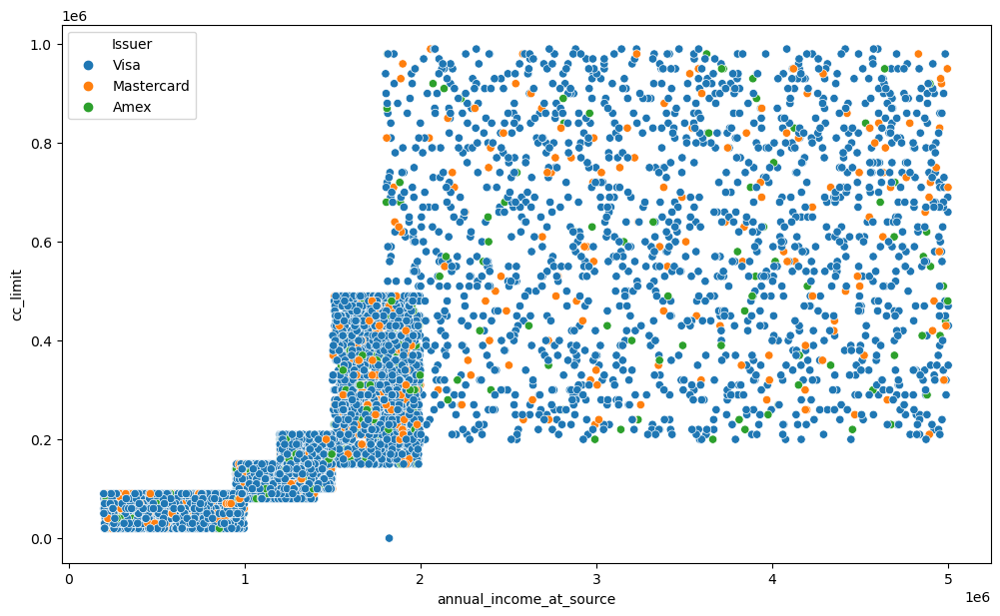

In [173]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.cc_limit, hue=df.Issuer);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

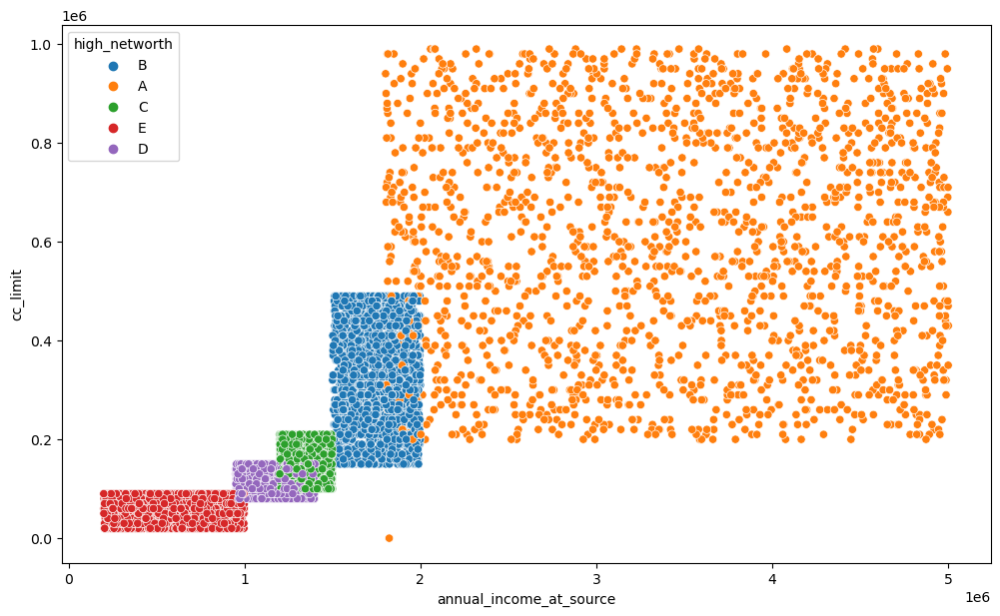

In [177]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.cc_limit, hue=df.high_networth);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

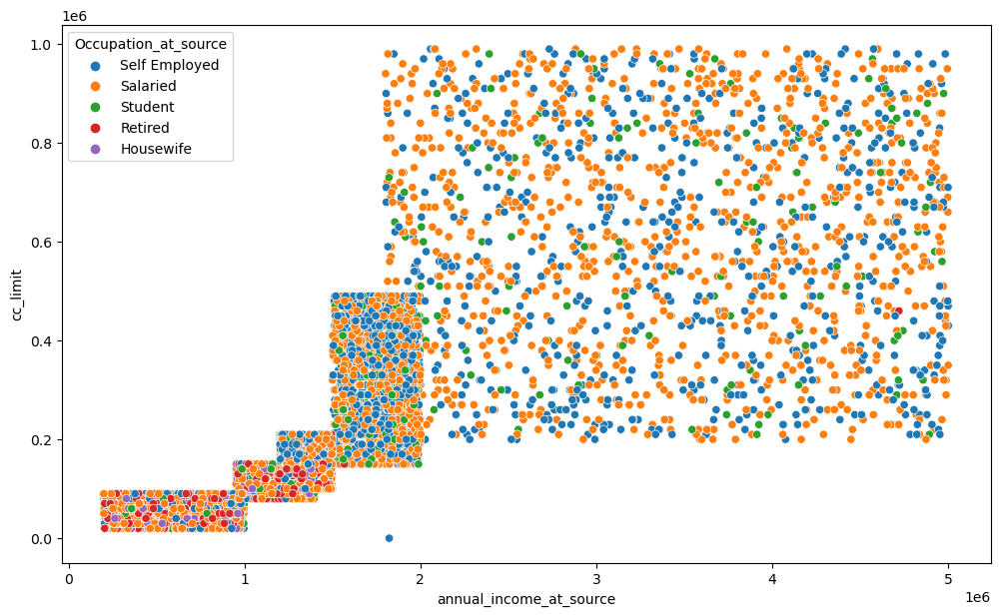

In [186]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.cc_limit, hue=df.Occupation_at_source);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

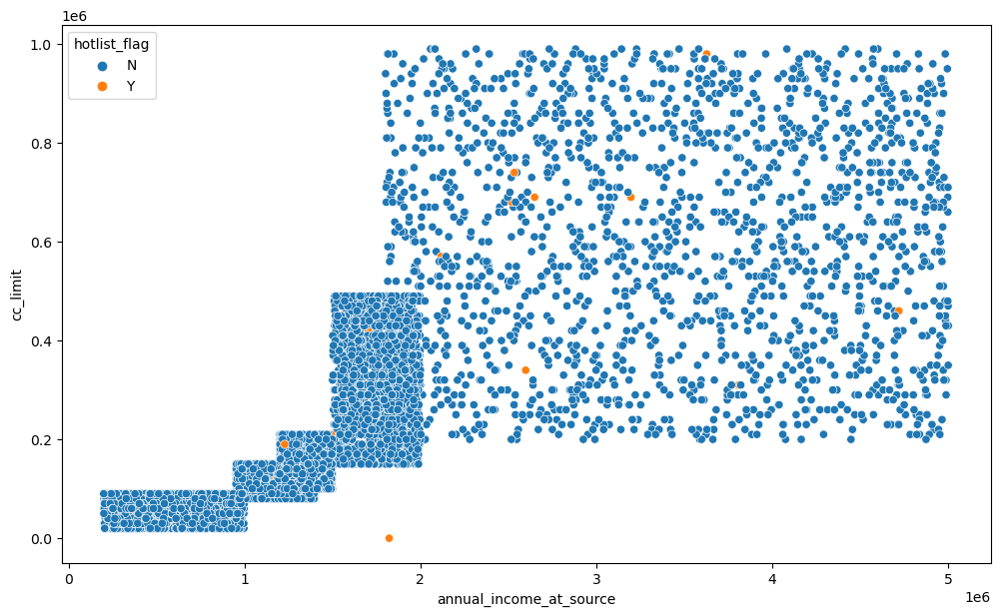

In [189]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.cc_limit, hue=df.hotlist_flag);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

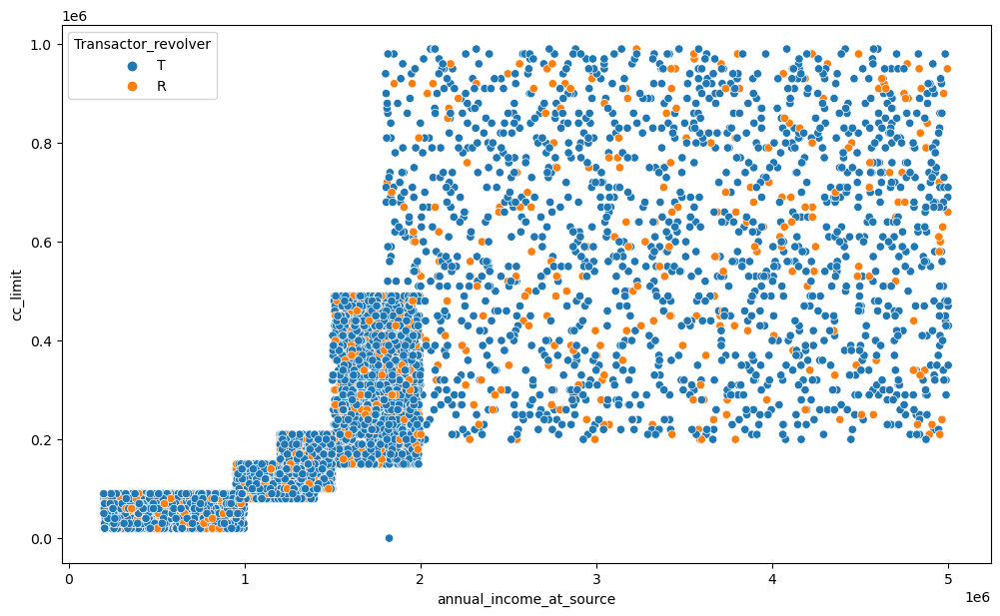

In [197]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.cc_limit, hue=df.Transactor_revolver);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

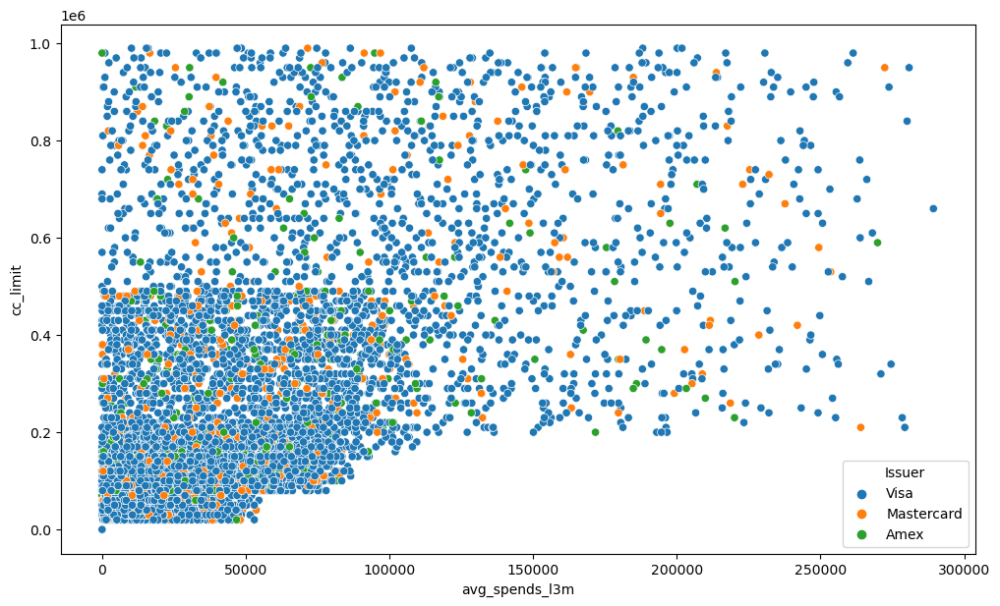

In [175]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.cc_limit, hue=df.Issuer);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

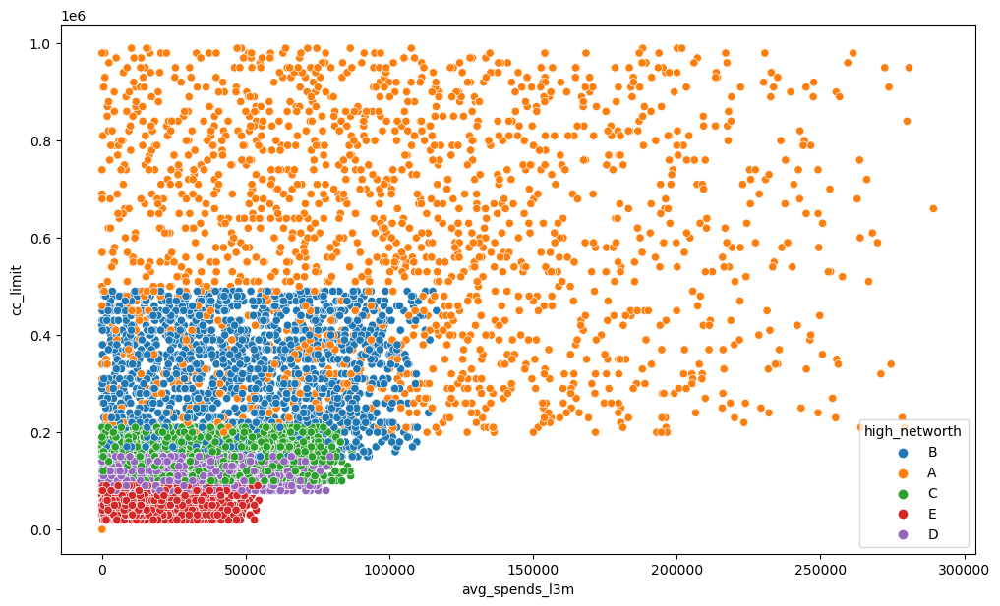

In [178]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.cc_limit, hue=df.high_networth);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

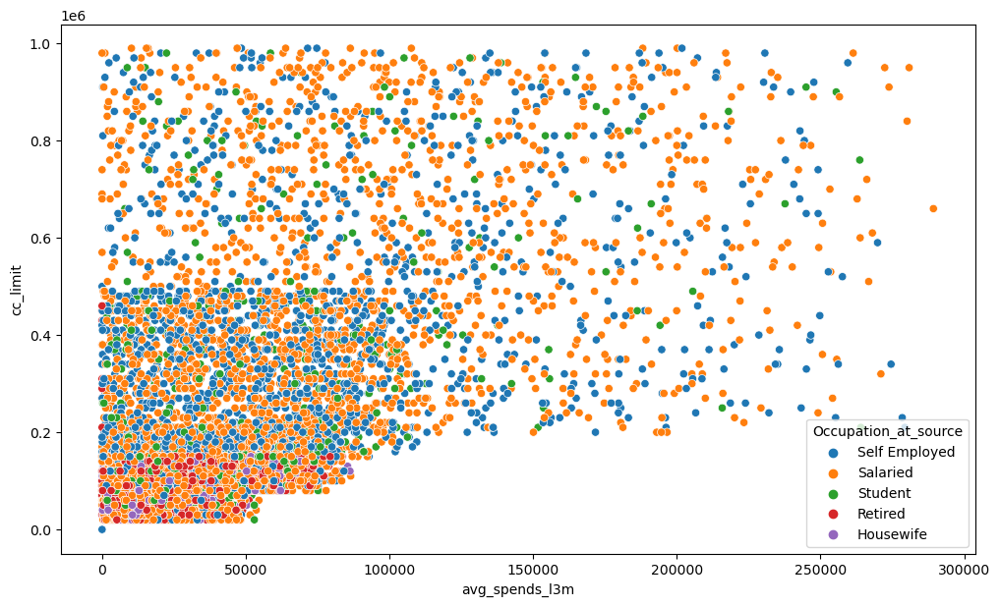

In [187]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.cc_limit, hue=df.Occupation_at_source);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

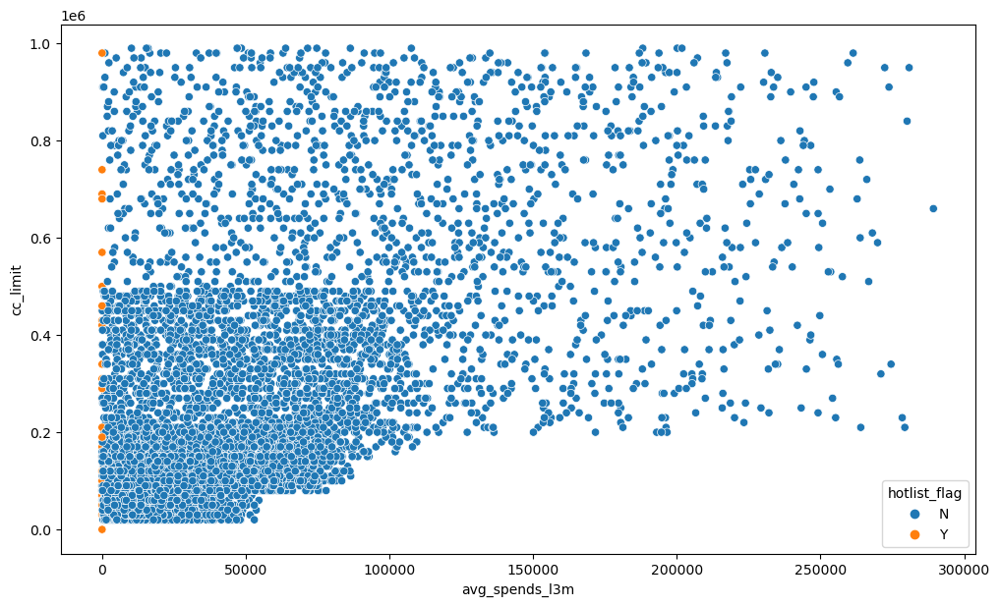

In [190]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.cc_limit, hue=df.hotlist_flag);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

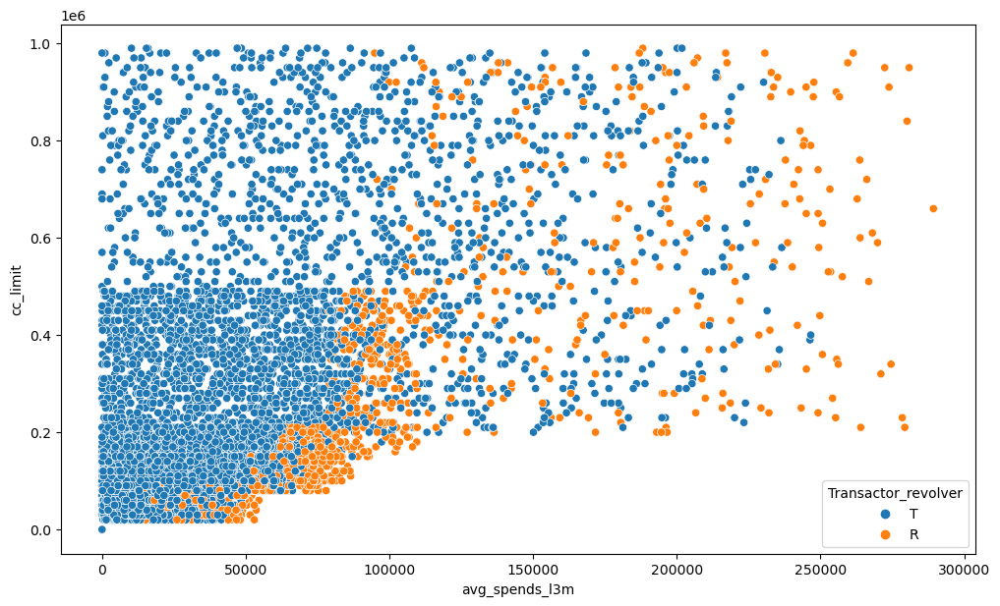

In [198]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.cc_limit, hue=df.Transactor_revolver);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

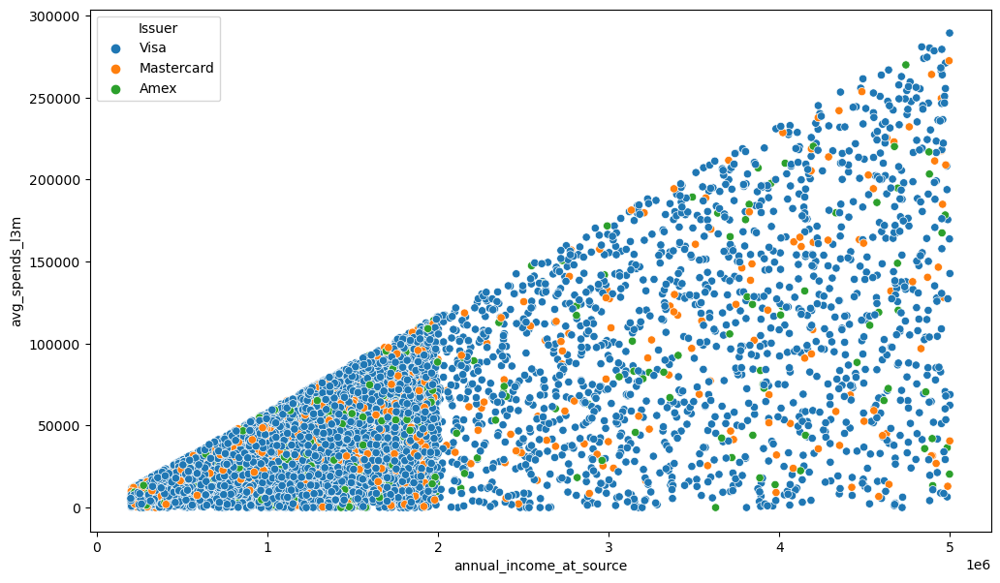

In [180]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.avg_spends_l3m, hue=df.Issuer);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

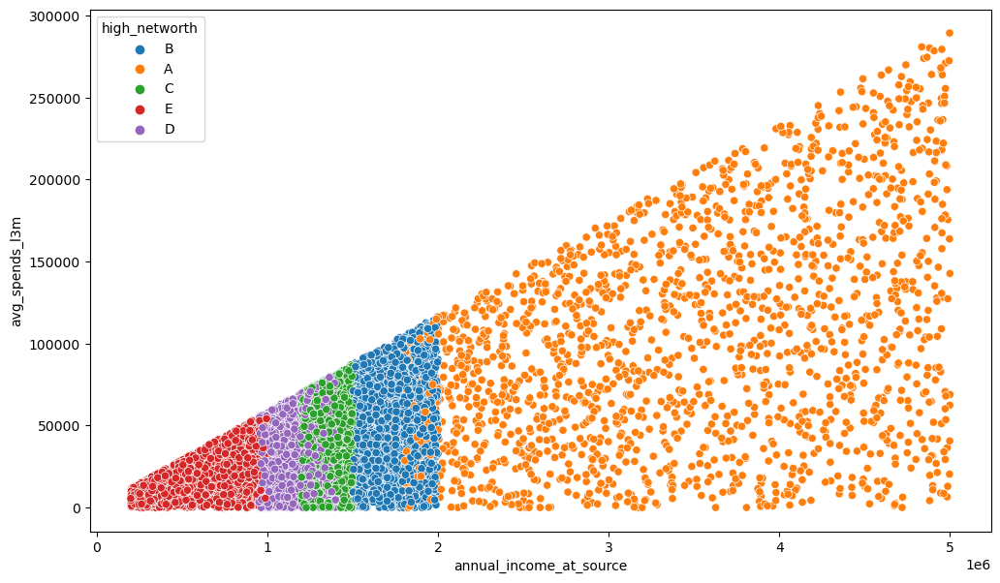

In [181]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.avg_spends_l3m, hue=df.high_networth);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

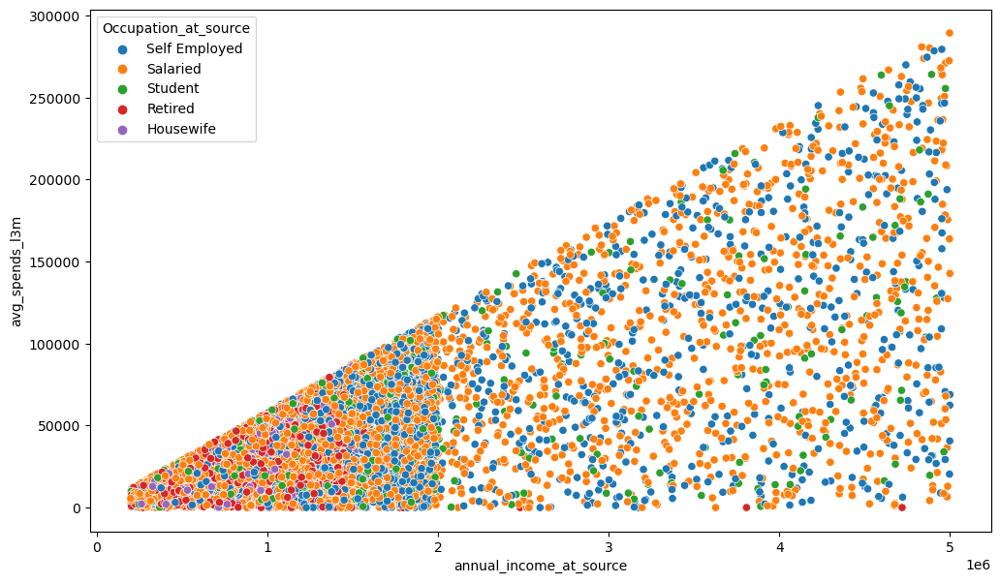

In [188]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.avg_spends_l3m, hue=df.Occupation_at_source);

In [182]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit',
       'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

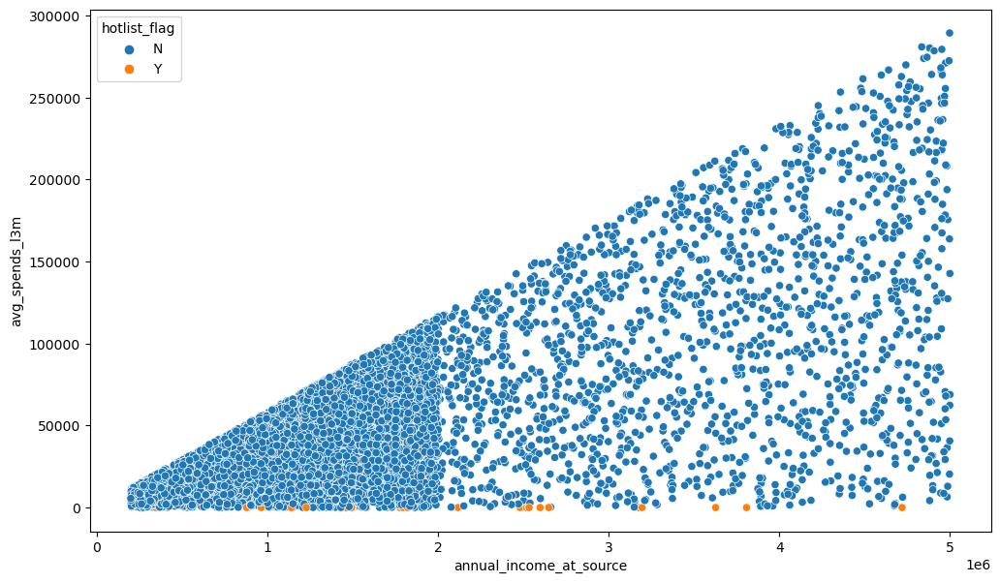

In [185]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.avg_spends_l3m, hue=df.hotlist_flag);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 1200x700 with 0 Axes>

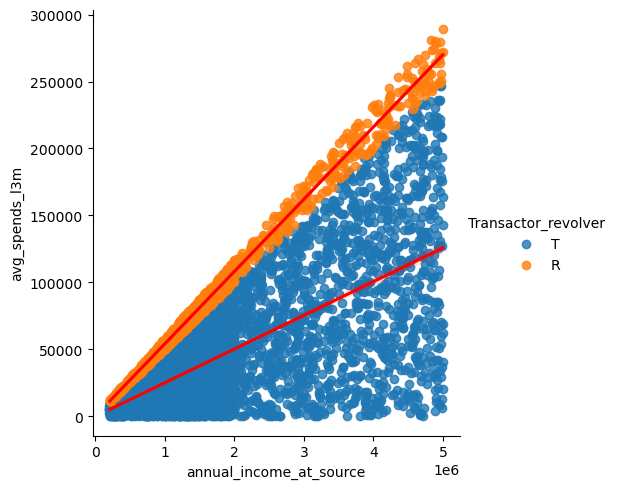

In [207]:
plt.figure(figsize=(12,7))
sns.lmplot(x='annual_income_at_source', y='avg_spends_l3m', data=df, hue='Transactor_revolver', line_kws={'color':'red'});

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

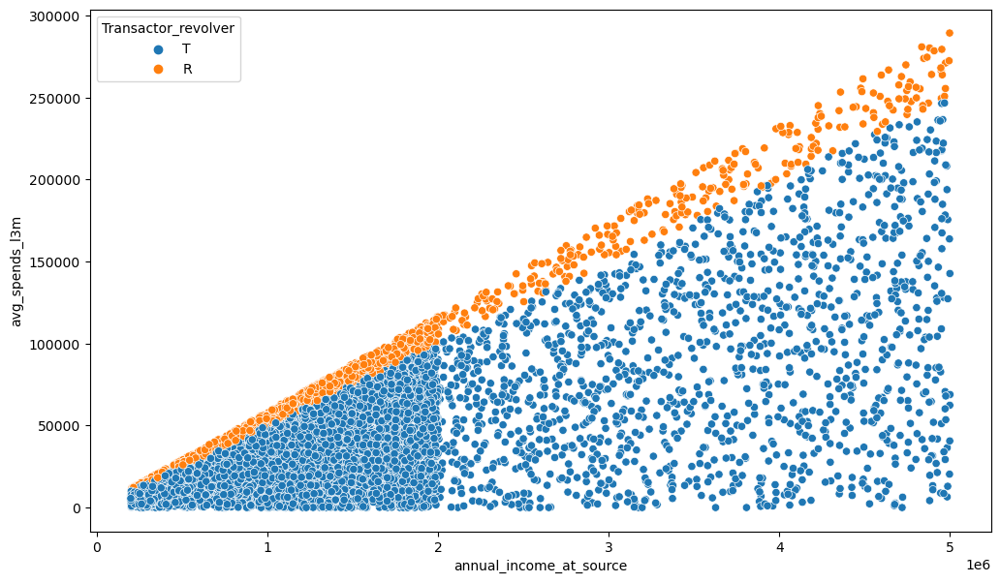

In [201]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.avg_spends_l3m, hue=df.Transactor_revolver);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

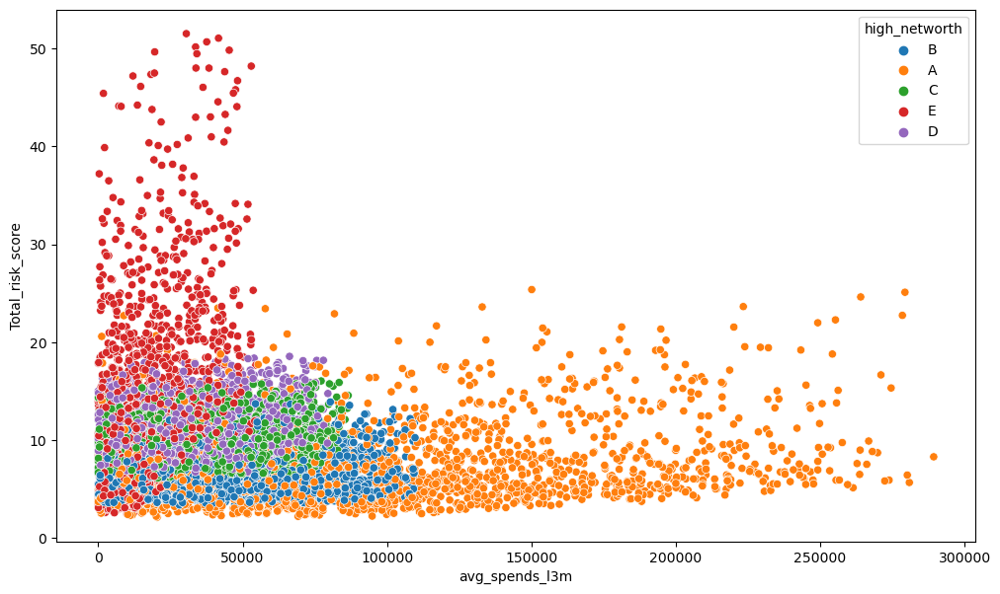

In [194]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.avg_spends_l3m, y=df.Total_risk_score, hue=df.high_networth);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

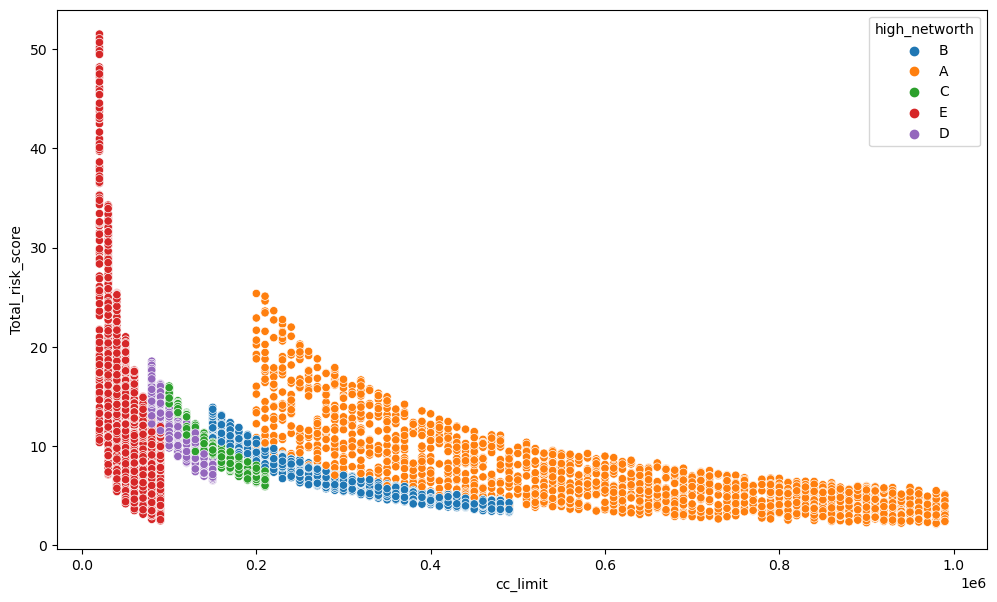

In [195]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.cc_limit, y=df.Total_risk_score, hue=df.high_networth);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

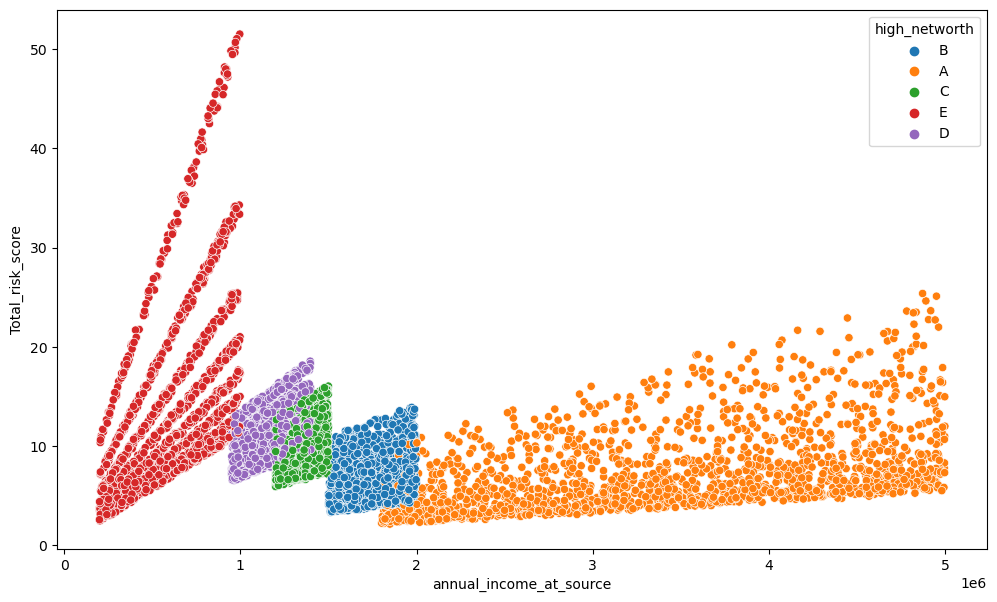

In [196]:
plt.figure(figsize=(12,7))
sns.scatterplot(x=df.annual_income_at_source, y=df.Total_risk_score, hue=df.high_networth);

In [217]:
df.columns

Index(['userid', 'card_no', 'card_bin_no', 'Issuer', 'card_type',
       'card_source_date', 'high_networth', 'active_30', 'active_60',
       'active_90', 'cc_active30', 'cc_active60', 'cc_active90',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'T+1_month_activity', 'T+2_month_activity', 'T+3_month_activity',
       'T+6_month_activity', 'T+12_month_activity', 'Transactor_revolver',
       'avg_spends_l3m', 'Occupation_at_source', 'cc_limit',
       'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

In [220]:
df_updated = df.drop(['userid','card_no','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1)

C:\Users\pranai\AppData\Local\Temp\ipykernel_20316\330826297.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df_updated = df.drop(['userid','card_no','card_bin_no','cc_active30','cc_active60','cc_active90','active_30','active_60','active_90','T+1_month_activity','T+2_month_activity','T+3_month_activity','T+6_month_activity','T+12_month_activity'],1)


In [221]:
df_updated.columns

Index(['Issuer', 'card_type', 'card_source_date', 'high_networth',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'Transactor_revolver', 'avg_spends_l3m', 'Occupation_at_source',
       'cc_limit', 'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 1200x1200 with 0 Axes>

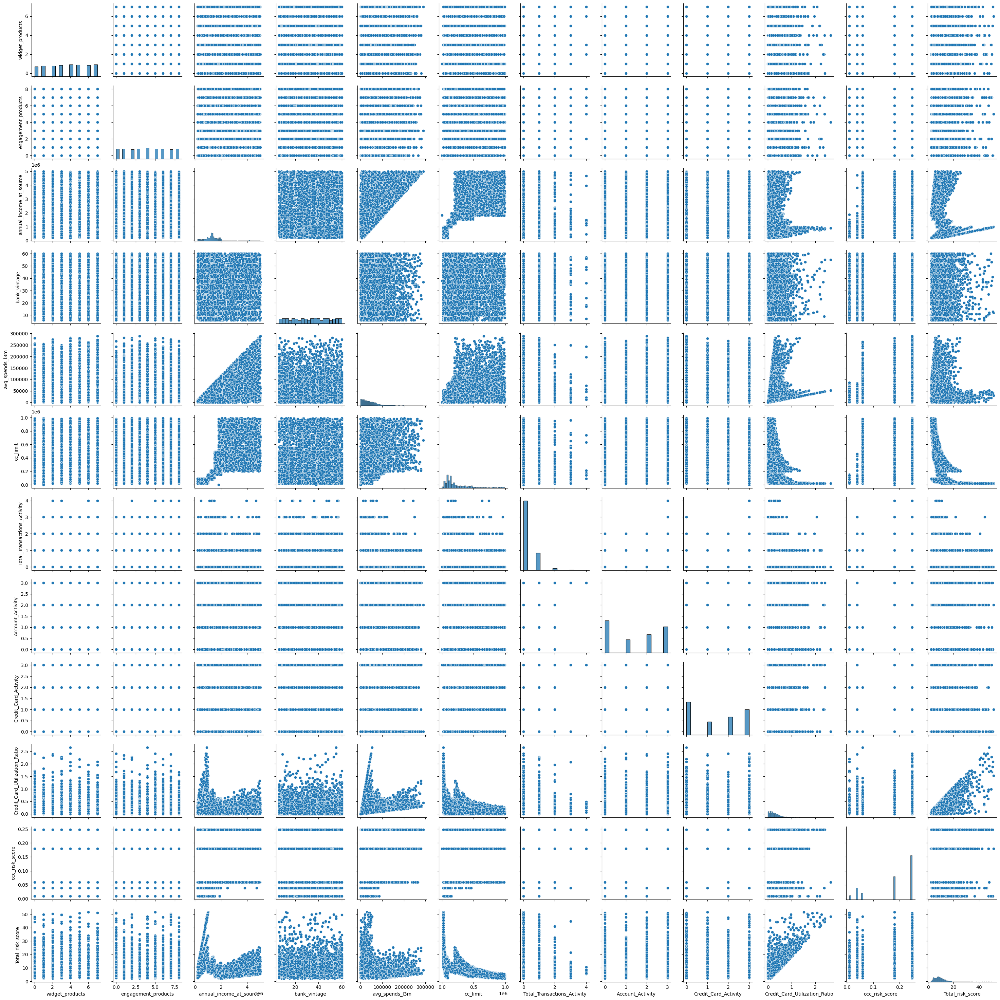

In [222]:
plt.figure(figsize=(12,12))
sns.pairplot(df_updated);

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 1200x1200 with 0 Axes>

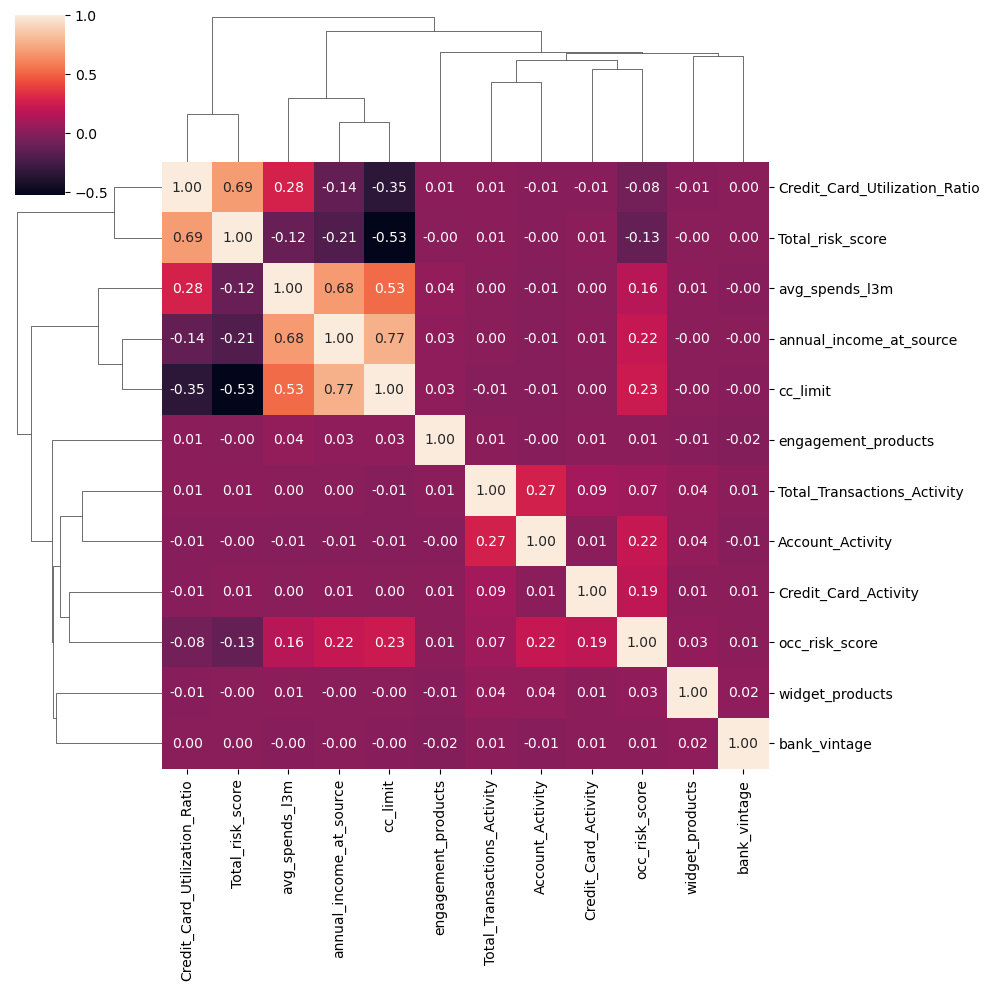

In [223]:
plt.figure(figsize=(12,12))
sns.clustermap(df_updated.corr(),annot=True,fmt='.2f');

In [116]:
df_updated.columns

Index(['Issuer', 'card_type', 'card_source_date', 'high_networth',
       'hotlist_flag', 'widget_products', 'engagement_products',
       'annual_income_at_source', 'other_bank_cc_holding', 'bank_vintage',
       'Transactor_revolver', 'avg_spends_l3m', 'Occupation_at_source',
       'cc_limit', 'Total_Transactions_Activity', 'Account_Activity',
       'Credit_Card_Activity', 'Credit_Card_Utilization_Ratio',
       'occ_risk_score', 'Total_risk_score'],
      dtype='object')

- Top 5 important variables for GoDigit Bank to make profits with justification.
    - **Total Income of the Customer (annual_income_at_source)** 
        - Income of the customer will give an idea to banks to whether give a credit card to a customer or not.
        - A high-income customer will utilize the credit card to it’s fullest and clear the dues within time and there’ll be no high risk. A valid point for banks to make profit and rely on customers with good credit history.
        - Usually, high salaried customer will be provided with credit card easily compared to the customer with low income.
    - **Credit card limit (cc_limit)** 
        - Credit card limit will let customer to know till how much to utilize and repay on time without any issues.
        - A high credit limit will let customer to spend more using card and hence banks can make profit only if customers spend more on card.
    - **Average spends on credit card (avg_spends_l3m)**
        - If customer’s spendings on the credit card are high then it is a valid indication that banks can make profit from those customers.
        - Average spends on last few months of the customers data will give an idea to cluster customers those spending high, medium, and low. Then provide different benefits and offers for different clustered customers.
    - **Total Risk Score (Total_risk_score)**
        - A risk score will be deciding factor whether to give a credit card to a particular customer or not.
        - High risk score always leads to bad impact on the customer and banks need to check those with high-risk score customers and try to lesser the credit card limits and update credit card policies accordingly.
        - Customers with low-risk score must be evaluated and loop them in with better offers and discounts which will eventually increases the revenue of the banks.
    - **Credit card utilization ratio (Credit_Card_Utilization_Ratio)**
        - A better usage of credit card will have positive impact on the bank’s revenue.
        - Customers with high ratio should be taken care and eventually those with low ratio needs to be addressed
        - A ratio can give us better understanding of usage of the credit card for different set of customers.
        - We can define a threshold ratio for customers who are falling low ratio and revert the policies. 